In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob as gb
import tensorflow as tf
import cv2
import keras

In [4]:
train_path='/content/drive/My Drive/Colab Notebooks/cnn_img/seg_train/'
test_path='/content/drive/My Drive/Colab Notebooks/cnn_img/seg_test/'
pred_path='/content/drive/My Drive/Colab Notebooks/cnn_img/seg_pred/'

In [5]:
for folder in os.listdir(train_path + 'seg_train'):
  file = gb.glob(pathname=str(train_path + 'seg_train/' + folder + '/*.jpg'))
  print(f'for training data, found {len(file)} in folder {folder}')

for training data, found 70 in folder glacier
for training data, found 60 in folder mountain
for training data, found 80 in folder street
for training data, found 90 in folder sea
for training data, found 70 in folder buildings
for training data, found 70 in folder forest


In [6]:
for folder in os.listdir(test_path + 'seg_test'):
  file = gb.glob(pathname=str(test_path + 'seg_test/' + folder + '/*.jpg'))
  print(f'for test data, found {len(file)} in folder {folder}')

for test data, found 90 in folder glacier
for test data, found 90 in folder mountain
for test data, found 120 in folder street
for test data, found 80 in folder sea
for test data, found 100 in folder buildings
for test data, found 80 in folder forest


In [7]:
file = gb.glob(pathname=str(pred_path + 'seg_pred/' + '/*.jpg'))
print(f'for pred data, found {len(file)}')

for pred data, found 90


In [8]:
size=[]
for folder in os.listdir(train_path + 'seg_train'):
  file = gb.glob(pathname=str(train_path + 'seg_train/' + folder + '/*.jpg'))
  for img in file:
    image=plt.imread(img)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    438
(113, 150, 3)      1
(140, 150, 3)      1
dtype: int64

In [9]:
size_1=[]
for folder_1 in os.listdir(test_path + 'seg_test'):
  file_1 = gb.glob(pathname=str(test_path + 'seg_test/' + folder_1 + '/*.jpg'))
  for img_1 in file_1:
    image_1=plt.imread(img_1)
    size_1.append(image_1.shape)
pd.Series(size_1).value_counts()

(150, 150, 3)    560
dtype: int64

In [10]:
size_2=[]
filesize_2=[]
file_2 = gb.glob(pathname=str(pred_path + 'seg_pred/' + '/*.jpg'))
for img_2 in file_2:
  image_2=plt.imread(img_2)
  size_2.append(image_2.shape)
pd.Series(size_2).value_counts()

(150, 150, 3)    90
dtype: int64

In [11]:
code={'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
def get_code(n):
  for x,y in code.items():
    if n==y:
      return x


In [12]:
file = gb.glob(pathname=str(pred_path + 'seg_pred/' + '/*.jpg'))
print(f'for pred data, found {len(file)}')

for pred data, found 90


In [13]:
size=[]
for folder in os.listdir(train_path + 'seg_train'):
  file = gb.glob(pathname=str(train_path + 'seg_train/' + folder + '/*.jpg'))
  for img in file:
    image=plt.imread(img)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    438
(113, 150, 3)      1
(140, 150, 3)      1
dtype: int64

In [14]:
size_1=[]
for folder_1 in os.listdir(test_path + 'seg_test'):
  file_1 = gb.glob(pathname=str(test_path + 'seg_test/' + folder_1 + '/*.jpg'))
  for img_1 in file_1:
    image_1=plt.imread(img_1)
    size_1.append(image_1.shape)
pd.Series(size_1).value_counts()

(150, 150, 3)    560
dtype: int64

In [15]:
size_2=[]
filesize_2=[]
file_2 = gb.glob(pathname=str(pred_path + 'seg_pred/' + '/*.jpg'))
for img_2 in file_2:
  image_2=plt.imread(img_2)
  size_2.append(image_2.shape)
pd.Series(size_2).value_counts()

(150, 150, 3)    90
dtype: int64

In [16]:
code={'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
def get_code(n):
  for x,y in code.items():
    if n==y:
      return x


In [17]:
x_train=[]
y_train=[]

size=[]
for folder in os.listdir(train_path + 'seg_train'):
  file = gb.glob(pathname=str(train_path + 'seg_train/' + folder + '/*.jpg'))
  for img in file:
    image=cv2.imread(img)
    resized_img=cv2.resize(image, (100, 100))
    x_train.append(resized_img)
    y_train.append(code[folder])

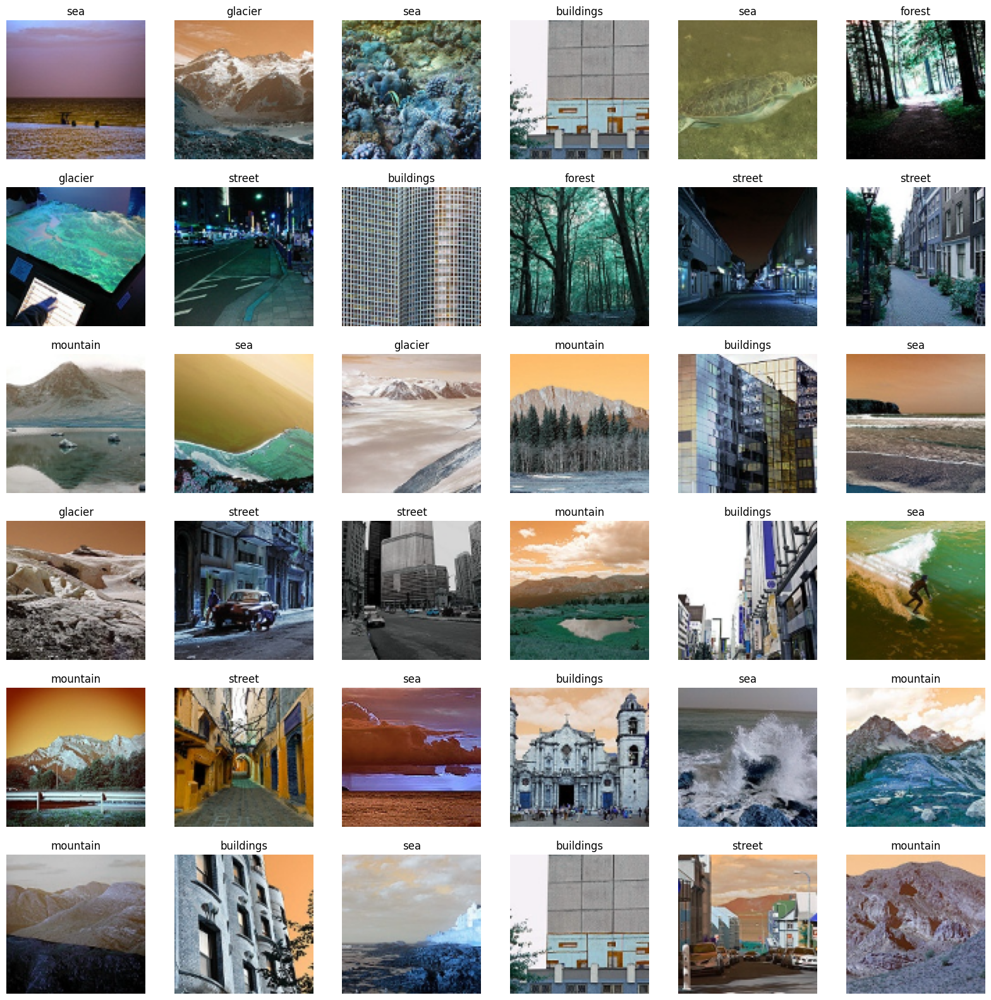

In [18]:
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_train), 36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_train[i])
  plt.axis('off')
  plt.title(get_code(y_train[i]))

In [19]:
x_test=[]
y_test=[]

size=[]
for folder in os.listdir(test_path + 'seg_test'):
  file = gb.glob(pathname=str(test_path + 'seg_test/' + folder + '/*.jpg'))
  for img in file:
    image=cv2.imread(img)
    resized_img=cv2.resize(image, (100, 100))
    x_test.append(resized_img)
    y_test.append(code[folder])

In [20]:
x_pred=[]

size=[]
file = gb.glob(pathname=str(pred_path + 'seg_pred/' + '/*.jpg'))
for img in file:
  image=cv2.imread(img)
  resized_img=cv2.resize(image, (100, 100))
  x_pred.append(resized_img)

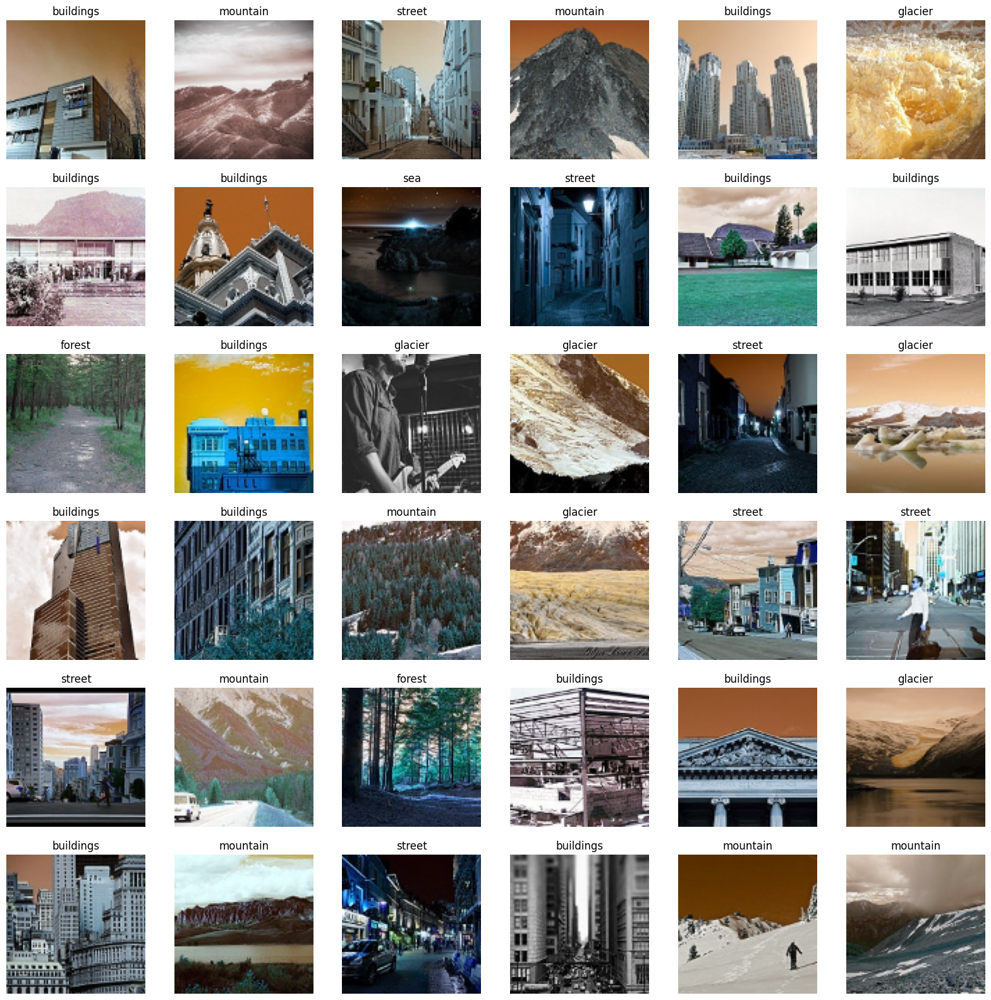

In [21]:
plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_test), 36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_test[i])
  plt.axis('off')
  plt.title(get_code(y_test[i]))

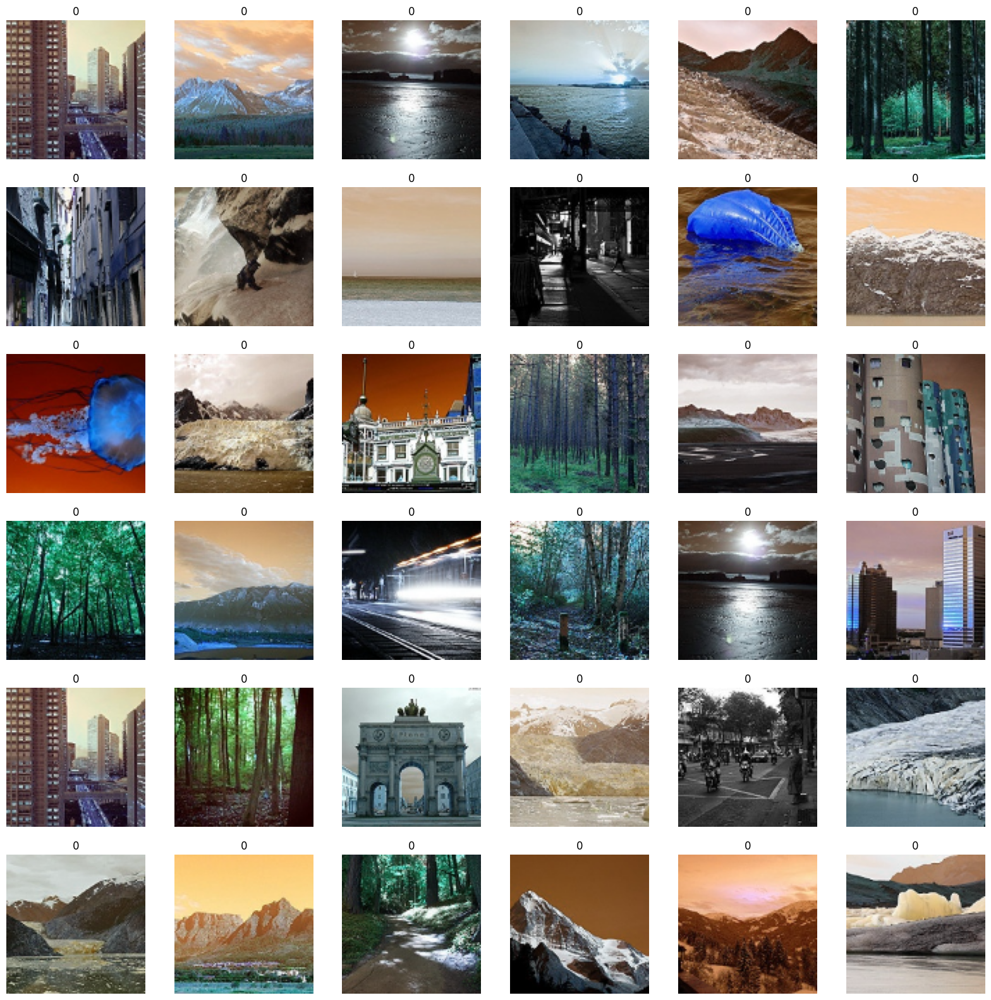

In [22]:
plt.figure(figsize=(20, 20))
for n,i in enumerate(list(np.random.randint(0, len(x_pred), 36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_pred[i])
  plt.axis('off')
  plt.title('0')

In [23]:
x_train = np.array(x_train)
x_test=np.array(x_test)
y_train=np.array(y_train)
y_test=np.array(y_test)
x_pred=np.array(x_pred)

#CNN

In [24]:
model=keras.models.Sequential([
    keras.layers.Conv2D(200, kernel_size=(3,3), activation='relu', input_shape=(100,100,3)),
    keras.layers.Conv2D(150, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(4,4),
    keras.layers.Conv2D(120, kernel_size=(3,3), activation='relu', input_shape=(100,100,3)),
    keras.layers.Conv2D(80, kernel_size=(3,3), activation='relu'),
    keras.layers.Conv2D(50, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(4,4),
    keras.layers.Flatten(),
    keras.layers.Dense(120, activation='relu'),
    keras.layers.Dropout(rate=0.2),
    keras.layers.Dense(6, activation='softmax')

    ])

In [25]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                                        

In [26]:
model.fit(x_train, y_train, epochs=5, batch_size=64, verbose=1)
loss, accuracy= model.evaluate(x_test, y_test)
print(f'loss= {loss}')
print (f'accuracy= {accuracy}')

Epoch 1/5
7/7 [==============================] - 106s 15s/step - loss: 16.7698 - accuracy: 0.1705
Epoch 2/5
7/7 [==============================] - 105s 15s/step - loss: 2.7504 - accuracy: 0.1909
Epoch 3/5
7/7 [==============================] - 104s 15s/step - loss: 1.8159 - accuracy: 0.1909
Epoch 4/5
7/7 [==============================] - 106s 15s/step - loss: 1.7541 - accuracy: 0.2159
Epoch 5/5
18/18 [==============================] - 41s 2s/step - loss: 1.5872 - accuracy: 0.3250
loss= 1.5871907472610474
accuracy= 0.32499998807907104


In [27]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                                        

In [28]:
y_pred = model.predict(x_test)
y_pred_classes= [np.argmax(z) for z in y_pred]

18/18 [==============================] - 41s 2s/step


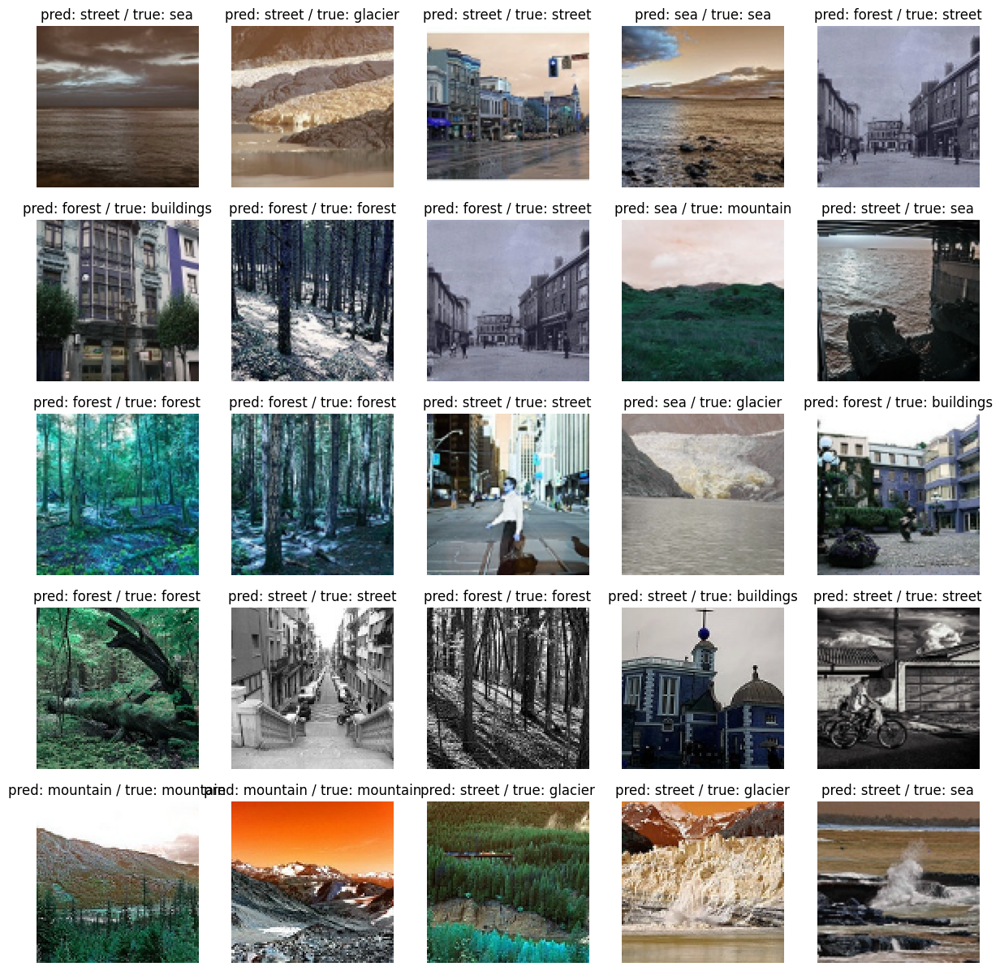

In [32]:
plt.figure(figsize=(15,15))
for n,i in enumerate(list(np.random.randint(0,len(x_test),25))):
    plt.subplot(5,5,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title('pred: '+ get_code(y_pred_classes[i])+" / true: " + get_code(y_test[i]))